# **IMPORTING LIBRARIES**

OBJECTIVE:This dataset consists of 32833 rows and 23 columns.The main objective is to segment Spotify songs into distinct genres based on audio features, enabling better genre classification and understanding of music preferences.By analyzing and modeling this data, machine learning and data science techniques can be applied to improve music recommendation, classification, and overall music discovery on platforms like Spotify.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.neighbors import NearestNeighbors

# **LOADING DATASET**

In [3]:
df = pd.read_csv("D:/MSC/INTERSHIP/AI/spotify dataset 1.csv")
df

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,14-06-2019,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.102000,0.000000,0.0653,0.5180,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),13-12-2019,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.072400,0.004210,0.3570,0.6930,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),05-07-2019,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.079400,0.000023,0.1100,0.6130,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,19-07-2019,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7,-3.778,1,0.1020,0.028700,0.000009,0.2040,0.2770,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),05-03-2019,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-4.672,1,0.0359,0.080300,0.000000,0.0833,0.7250,123.976,189052
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32828,7bxnKAamR3snQ1VGLuVfC1,City Of Lights - Official Radio Edit,Lush & Simon,42,2azRoBBWEEEYhqV6sb7JrT,City Of Lights (Vocal Mix),28-04-2014,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,2,-1.814,1,0.0936,0.076600,0.000000,0.0668,0.2100,128.170,204375
32829,5Aevni09Em4575077nkWHz,Closer - Sultan & Ned Shepard Remix,Tegan and Sara,20,6kD6KLxj7s8eCE3ABvAyf5,Closer Remixed,08-03-2013,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,0,-4.462,1,0.0420,0.001710,0.004270,0.3750,0.4000,128.041,353120
32830,7ImMqPP3Q1yfUHvsdn7wEo,Sweet Surrender - Radio Edit,Starkillers,14,0ltWNSY9JgxoIZO4VzuCa6,Sweet Surrender (Radio Edit),21-04-2014,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,6,-4.899,0,0.0481,0.108000,0.000001,0.1500,0.4360,127.989,210112
32831,2m69mhnfQ1Oq6lGtXuYhgX,Only For You - Maor Levi Remix,Mat Zo,15,1fGrOkHnHJcStl14zNx8Jy,Only For You (Remixes),01-01-2014,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,2,-3.361,1,0.1090,0.007920,0.127000,0.3430,0.3080,128.008,367432


In [4]:
df.head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,14-06-2019,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),13-12-2019,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),05-07-2019,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,19-07-2019,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),05-03-2019,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052


In [5]:
df.tail()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
32828,7bxnKAamR3snQ1VGLuVfC1,City Of Lights - Official Radio Edit,Lush & Simon,42,2azRoBBWEEEYhqV6sb7JrT,City Of Lights (Vocal Mix),28-04-2014,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,2,-1.814,1,0.0936,0.076600,0.000000,0.0668,0.2100,128.170,204375
32829,5Aevni09Em4575077nkWHz,Closer - Sultan & Ned Shepard Remix,Tegan and Sara,20,6kD6KLxj7s8eCE3ABvAyf5,Closer Remixed,08-03-2013,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,0,-4.462,1,0.0420,0.001710,0.004270,0.3750,0.4000,128.041,353120
32830,7ImMqPP3Q1yfUHvsdn7wEo,Sweet Surrender - Radio Edit,Starkillers,14,0ltWNSY9JgxoIZO4VzuCa6,Sweet Surrender (Radio Edit),21-04-2014,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,6,-4.899,0,0.0481,0.108000,0.000001,0.1500,0.4360,127.989,210112
32831,2m69mhnfQ1Oq6lGtXuYhgX,Only For You - Maor Levi Remix,Mat Zo,15,1fGrOkHnHJcStl14zNx8Jy,Only For You (Remixes),01-01-2014,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,2,-3.361,1,0.1090,0.007920,0.127000,0.3430,0.3080,128.008,367432
32832,29zWqhca3zt5NsckZqDf6c,Typhoon - Original Mix,Julian Calor,27,0X3mUOm6MhxR7PzxG95rAo,Typhoon/Storm,03-03-2014,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,5,-4.571,0,0.0385,0.000133,0.341000,0.7420,0.0894,127.984,337500


In [6]:
df.describe()

,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
count,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000
mean,42.477081,0.654850,0.698619,5.374471,-6.719499,0.565711,0.107068,0.175334,0.084747,0.190176,0.510561,120.881132,225799.811622
std,24.984074,0.145085,0.180910,3.611657,2.988436,0.495671,0.101314,0.219633,0.224230,0.154317,0.233146,26.903624,59834.006182
min,0.000000,0.000000,0.000175,0.000000,-46.448000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4000.000000
25%,24.000000,0.563000,0.581000,2.000000,-8.171000,0.000000,0.041000,0.015100,0.000000,0.092700,0.331000,99.960000,187819.000000
50%,45.000000,0.672000,0.721000,6.000000,-6.166000,1.000000,0.062500,0.080400,0.000016,0.127000,0.512000,121.984000,216000.000000
75%,62.000000,0.761000,0.840000,9.000000,-4.645000,1.000000,0.132000,0.255000,0.004830,0.248000,0.693000,133.918000,253585.000000
max,100.000000,0.983000,1.000000,11.000000,1.275000,1.000000,0.918000,0.994000,0.994000,0.996000,0.991000,239.440000,517810.000000


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32833 entries, 0 to 32832
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32833 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32833 non-null  int64  
 4   track_album_id            32833 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32833 non-null  object 
 7   playlist_name             32833 non-null  object 
 8   playlist_id               32833 non-null  object 
 9   playlist_genre            32833 non-null  object 
 10  playlist_subgenre         32833 non-null  object 
 11  danceability              32833 non-null  float64
 12  energy                    32833 non-null  float64
 13  key                       32833 non-null  int64  
 14  loudne

In [10]:
df.duplicated().sum()

0

# **DATA PREPROCESSING**

## **Handle Missing Values**

In [12]:
df.isnull().sum()

track_id                    0
track_name                  0
track_artist                0
track_popularity            0
track_album_id              0
track_album_name            0
track_album_release_date    0
playlist_name               0
playlist_id                 0
playlist_genre              0
playlist_subgenre           0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
dtype: int64

In [11]:
df.ffill(inplace=True)
df

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,14-06-2019,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.102000,0.000000,0.0653,0.5180,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),13-12-2019,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.072400,0.004210,0.3570,0.6930,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),05-07-2019,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.079400,0.000023,0.1100,0.6130,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,19-07-2019,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7,-3.778,1,0.1020,0.028700,0.000009,0.2040,0.2770,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),05-03-2019,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-4.672,1,0.0359,0.080300,0.000000,0.0833,0.7250,123.976,189052
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32828,7bxnKAamR3snQ1VGLuVfC1,City Of Lights - Official Radio Edit,Lush & Simon,42,2azRoBBWEEEYhqV6sb7JrT,City Of Lights (Vocal Mix),28-04-2014,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,2,-1.814,1,0.0936,0.076600,0.000000,0.0668,0.2100,128.170,204375
32829,5Aevni09Em4575077nkWHz,Closer - Sultan & Ned Shepard Remix,Tegan and Sara,20,6kD6KLxj7s8eCE3ABvAyf5,Closer Remixed,08-03-2013,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,0,-4.462,1,0.0420,0.001710,0.004270,0.3750,0.4000,128.041,353120
32830,7ImMqPP3Q1yfUHvsdn7wEo,Sweet Surrender - Radio Edit,Starkillers,14,0ltWNSY9JgxoIZO4VzuCa6,Sweet Surrender (Radio Edit),21-04-2014,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,6,-4.899,0,0.0481,0.108000,0.000001,0.1500,0.4360,127.989,210112
32831,2m69mhnfQ1Oq6lGtXuYhgX,Only For You - Maor Levi Remix,Mat Zo,15,1fGrOkHnHJcStl14zNx8Jy,Only For You (Remixes),01-01-2014,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,2,-3.361,1,0.1090,0.007920,0.127000,0.3430,0.3080,128.008,367432


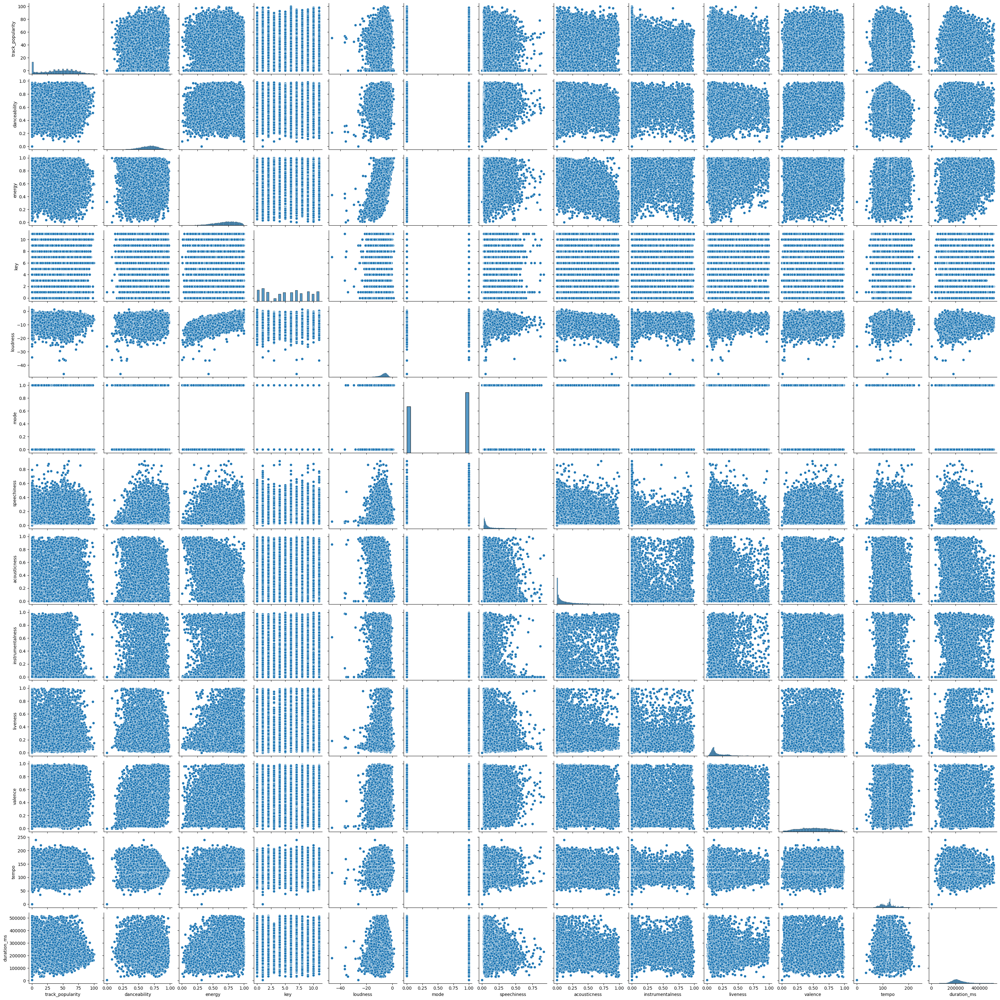

In [13]:
import seaborn as sns 
sns.pairplot(df)

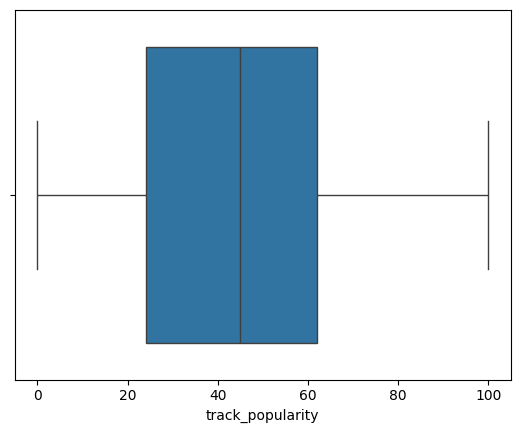

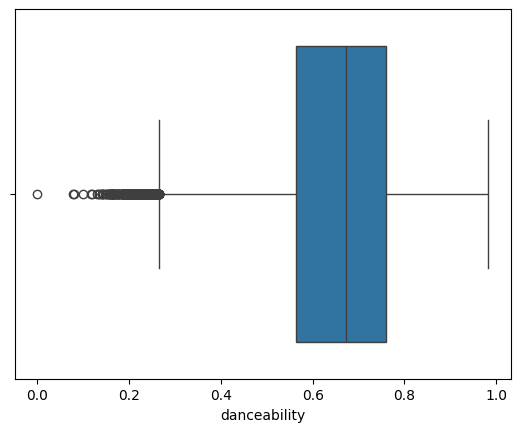

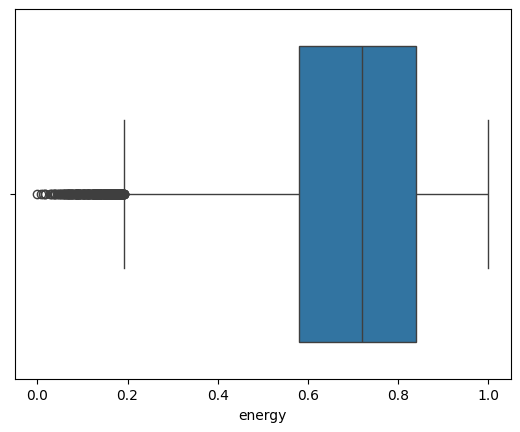

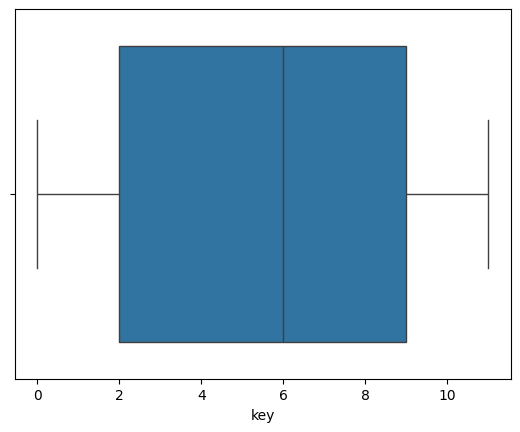

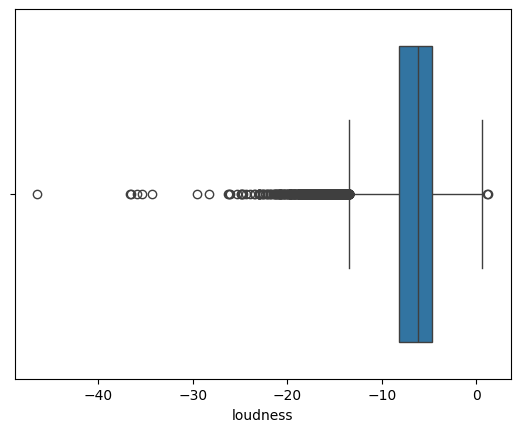

...

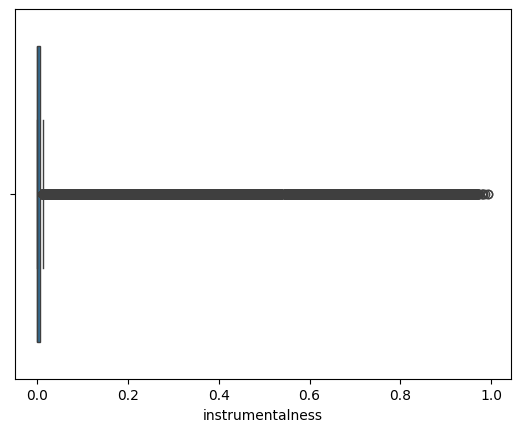

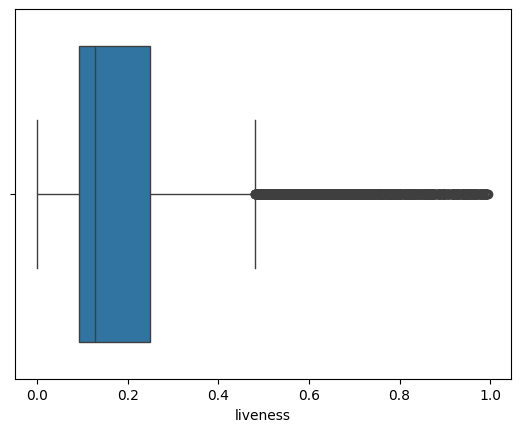

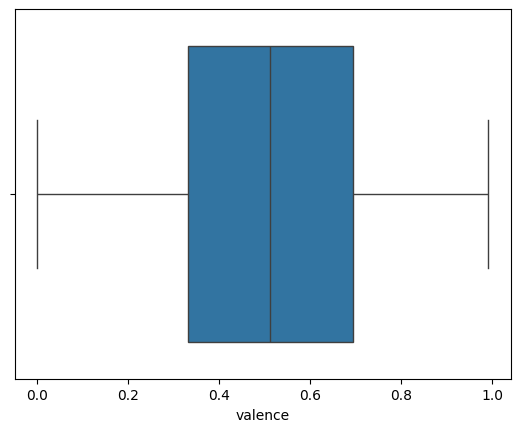

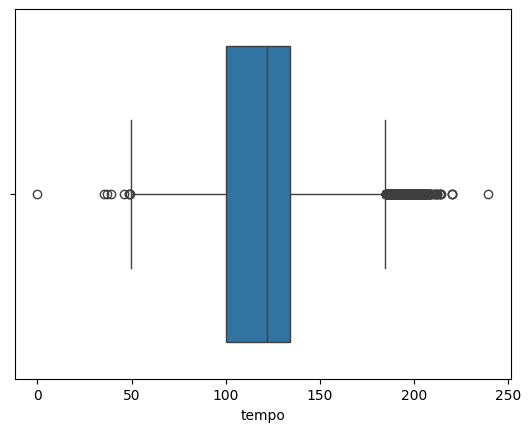

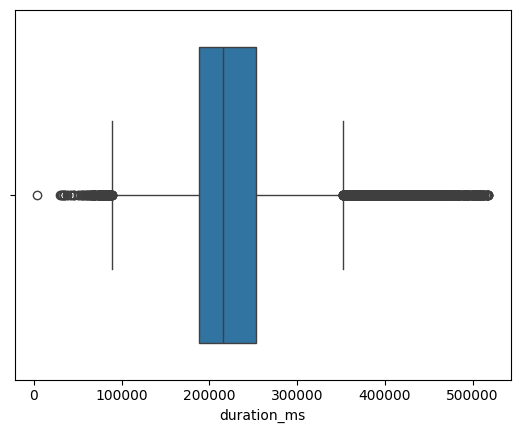

In [14]:
#boxplot to check outliers
import matplotlib.pyplot as plt
import seaborn as sns
for i in df.select_dtypes(include="number").columns:
    sns.boxplot(data=df,x=i)
    plt.show()
    

In [15]:
#Treating outliers
import numpy as np
def wisker(col):
    q1,q3=np.percentile(col,[25,75])
    iqr=q3-q1
    lw=q1-1.5*iqr
    uw=q3+1.5*iqr
    return lw,uw

In [16]:
wisker(df['energy'])

(0.19249999999999995, 1.2285)

In [17]:
for i in ['energy']:
    lw,uw=wisker(df[i])
    df.loc[df[i] < lw, i] = lw
    df.loc[df[i] > uw, i] = uw

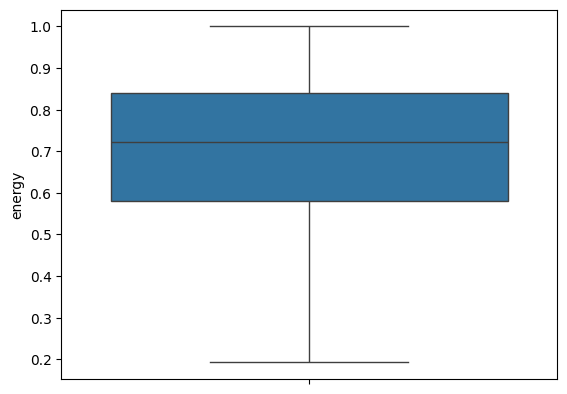

In [18]:
for i in ['energy']:
    sns.boxplot(df[i])
    plt.show()

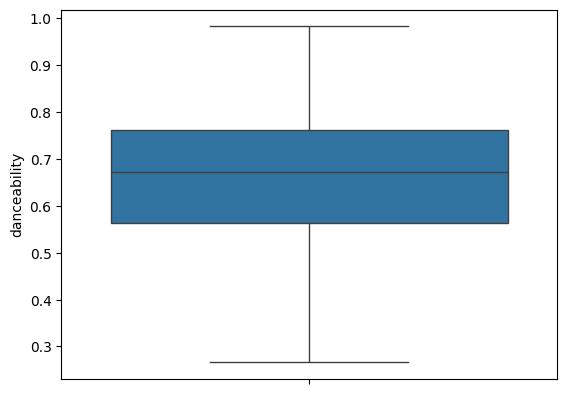

In [19]:
wisker(df['danceability'])
for i in ['danceability']:
    lw,uw=wisker(df[i])
    df.loc[df[i] < lw, i] = lw
    df.loc[df[i] > uw, i] = uw
for i in ['danceability']:
    sns.boxplot(df[i])
    plt.show()

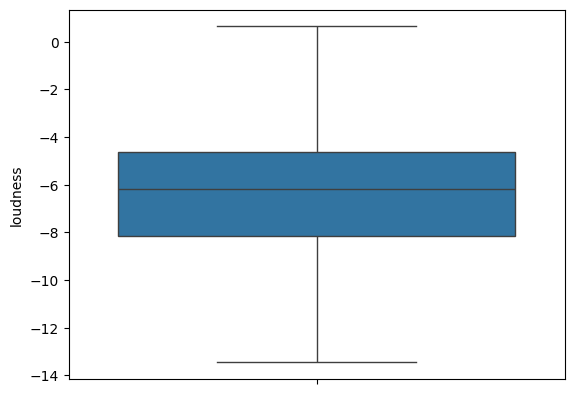

In [20]:
wisker(df['loudness'])
for i in ['loudness']:
    lw,uw=wisker(df[i])
    df.loc[df[i] < lw, i] = lw
    df.loc[df[i] > uw, i] = uw
for i in ['loudness']:
    sns.boxplot(df[i])
    plt.show()

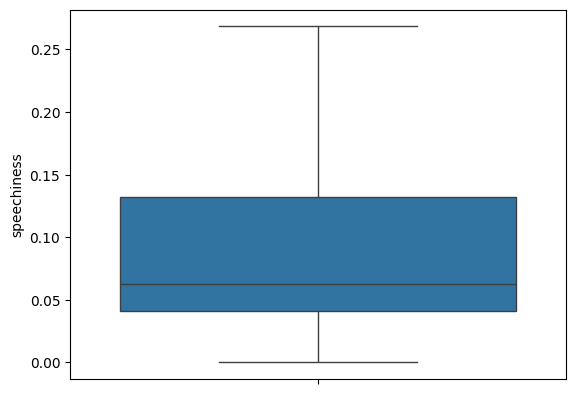

In [21]:
wisker(df['speechiness'])
for i in ['speechiness']:
    lw,uw=wisker(df[i])
    df.loc[df[i] < lw, i] = lw
    df.loc[df[i] > uw, i] = uw
for i in ['speechiness']:
    sns.boxplot(df[i])
    plt.show()

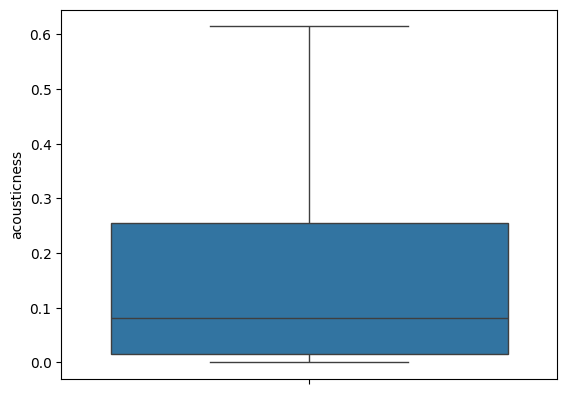

In [22]:
wisker(df['acousticness'])
for i in ['acousticness']:
    lw,uw=wisker(df[i])
    df.loc[df[i] < lw, i] = lw
    df.loc[df[i] > uw, i] = uw
for i in ['acousticness']:
    sns.boxplot(df[i])
    plt.show()

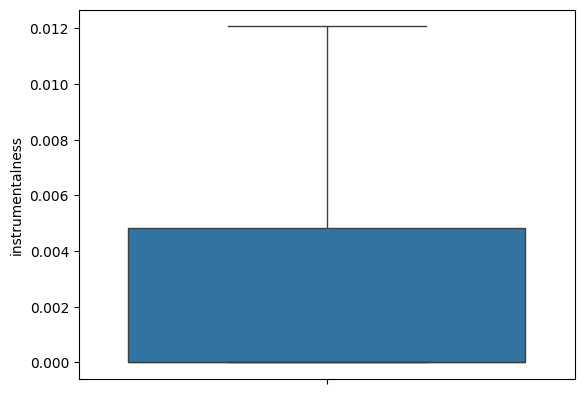

In [23]:
wisker(df['instrumentalness'])
for i in ['instrumentalness']:
    lw,uw=wisker(df[i])
    df.loc[df[i] < lw, i] = lw
    df.loc[df[i] > uw, i] = uw
for i in ['instrumentalness']:
    sns.boxplot(df[i])
    plt.show()

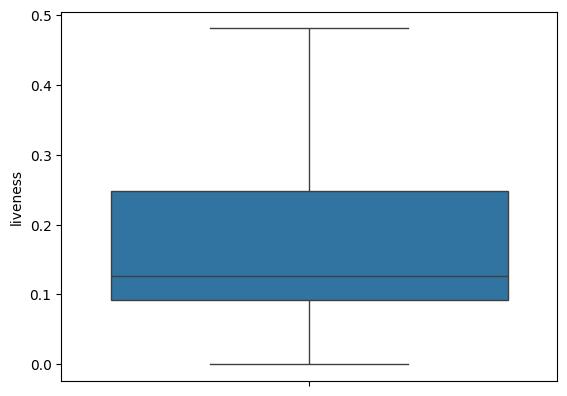

In [24]:
wisker(df['liveness'])
for i in ['liveness']:
    lw,uw=wisker(df[i])
    df.loc[df[i] < lw, i] = lw
    df.loc[df[i] > uw, i] = uw
for i in ['liveness']:
    sns.boxplot(df[i])
    plt.show()

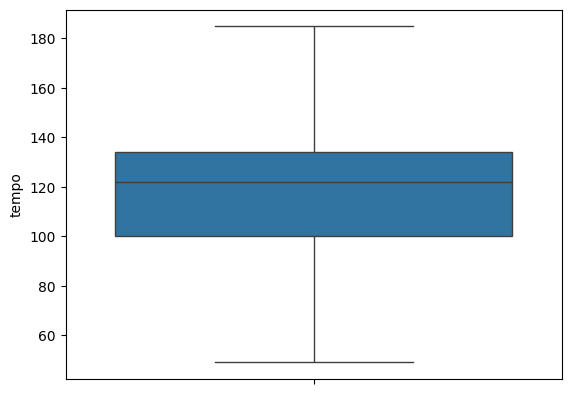

In [25]:
wisker(df['tempo'])
for i in ['tempo']:
    lw,uw=wisker(df[i])
    df.loc[df[i] < lw, i] = lw
    df.loc[df[i] > uw, i] = uw
for i in ['tempo']:
    sns.boxplot(df[i])
    plt.show()

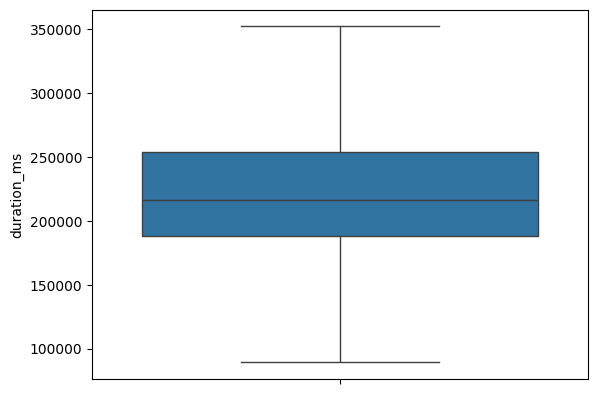

In [26]:
wisker(df['duration_ms'])
for i in ['duration_ms']:
    lw,uw=wisker(df[i])
    df.loc[df[i] < lw, i] = lw
    df.loc[df[i] > uw, i] = uw
for i in ['duration_ms']:
    sns.boxplot(df[i])
    plt.show()

## **Encoding Categorical Variables**

In [28]:
label_encoder = LabelEncoder()
df['track_artist'] = label_encoder.fit_transform(df['track_artist'])
df['track_album_name'] = label_encoder.fit_transform(df['track_album_name'])
df['playlist_name'] = label_encoder.fit_transform(df['playlist_name'])
df['playlist_genre'] = label_encoder.fit_transform(df['playlist_genre'])
df['playlist_subgenre'] = label_encoder.fit_transform(df['playlist_subgenre'])


## **Nomralizing Numerical Features**

In [29]:
scaler = StandardScaler()
numfeatures = ['danceability', 'energy', 'key', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']
df[numfeatures] = scaler.fit_transform(df[numfeatures])

# **DATA ANALYSIS AND VISUALIZATION**

## **Distribution Plots**

[Text(0.5, 1.0, 'Genres by Popularity')]

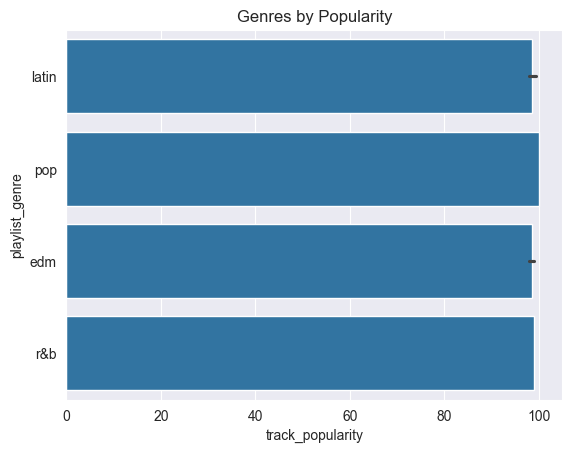

In [27]:
sns.set_style(style="darkgrid")
plt.figure(figure=(10,5))
famous=df.sort_values("track_popularity",ascending=False).head(10)
sns.barplot(y='playlist_genre',x='track_popularity',data=famous).set(title="Genres by Popularity")

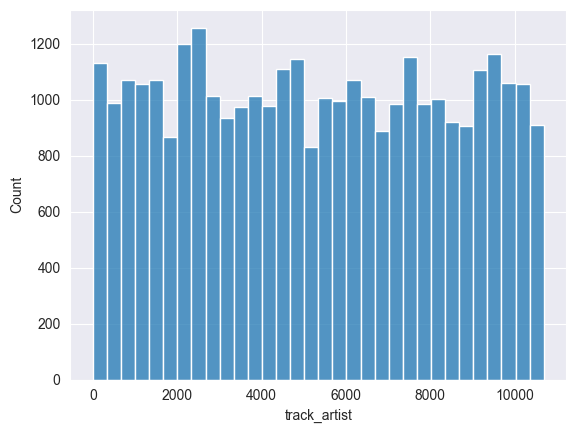

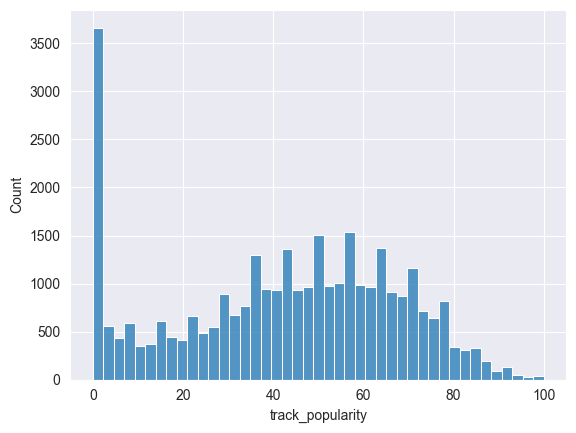

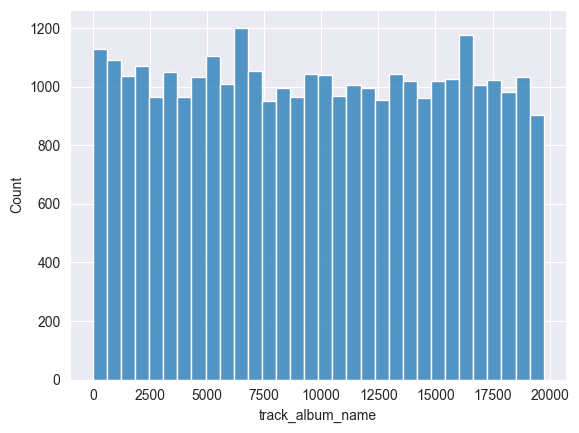

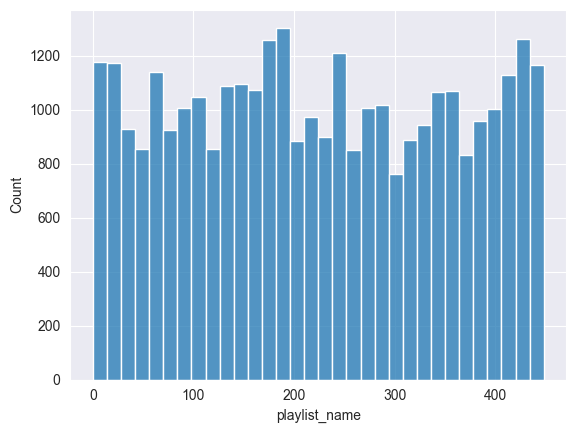

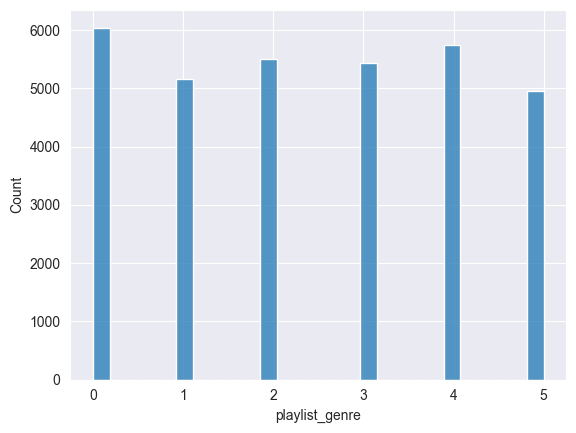

...

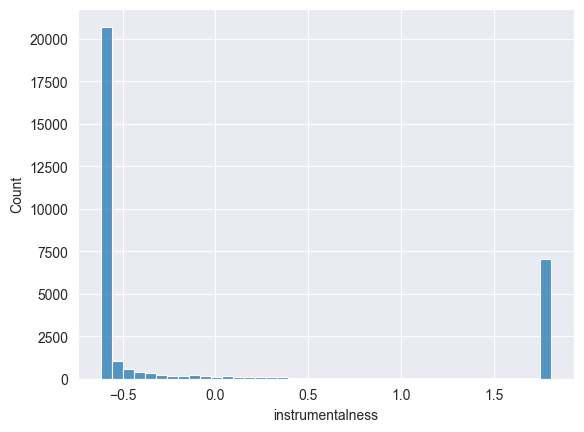

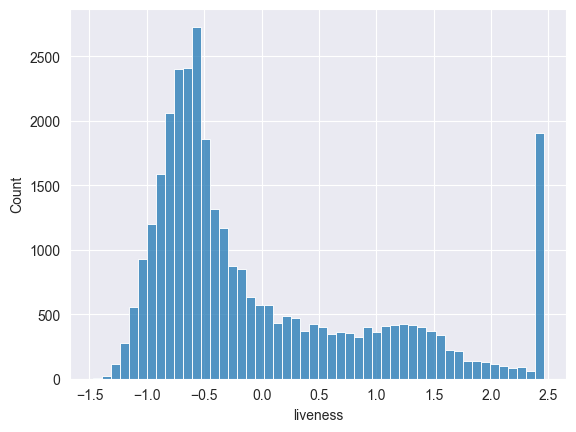

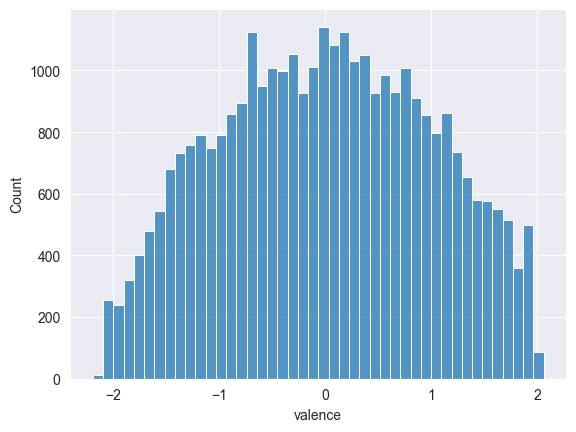

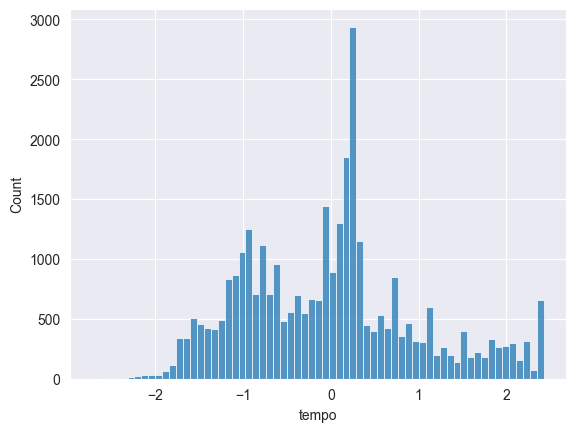

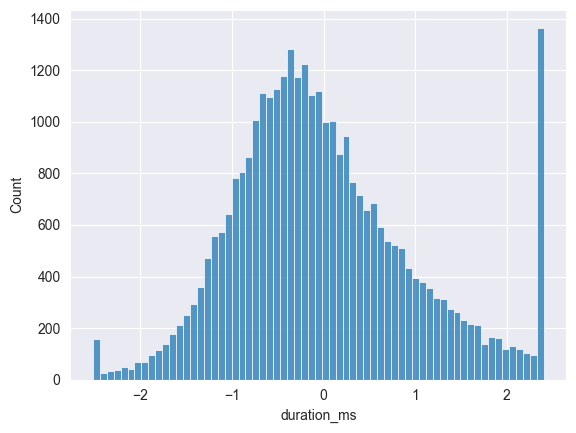

In [30]:
for i in df.select_dtypes(include="number").columns:
    sns.histplot(data=df,x=i)
    plt.show()

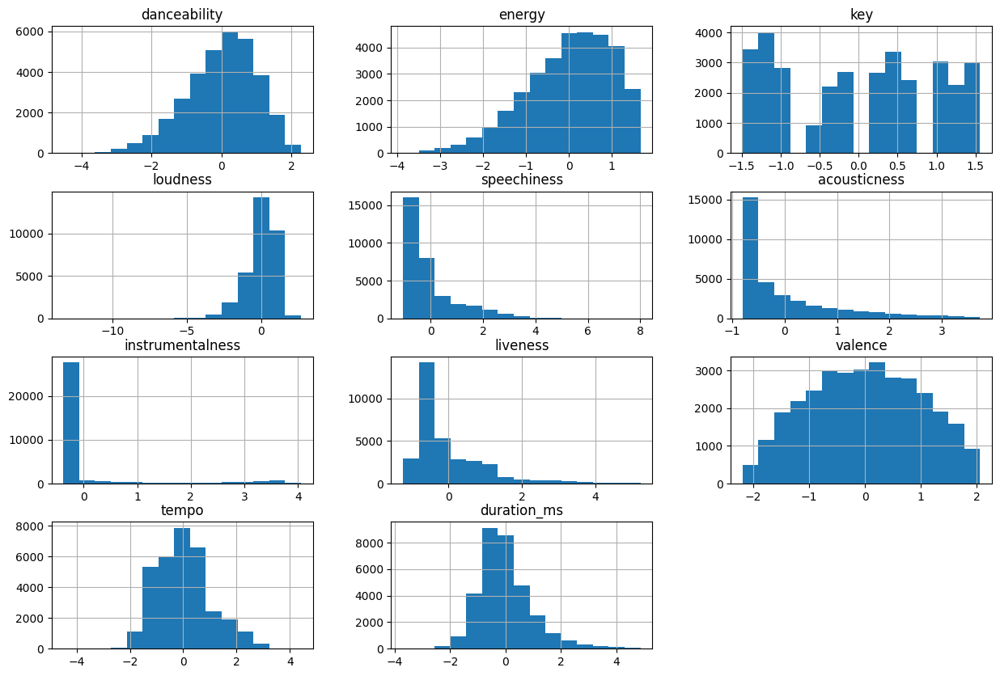

In [ ]:
df[numfeatures].hist(bins=15, figsize=(15, 10))
plt.show()

These different plots show how the data is distributed according to different columns.

## **Genre Analysis**

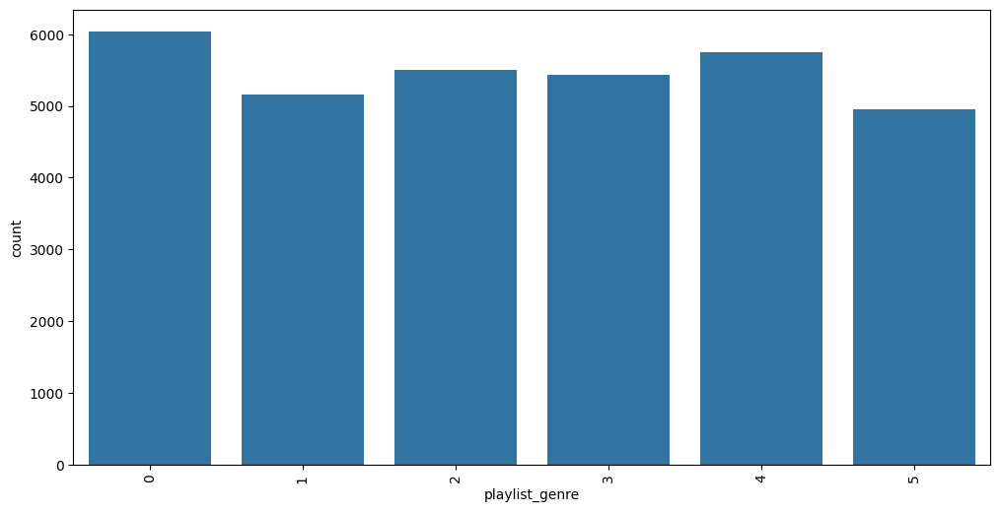

In [ ]:
plt.figure(figsize=(12, 6))
sns.countplot(x='playlist_genre', data=df)
plt.xticks(rotation=90)
plt.show()

The graph shows the analysis of Genre.

## **Sub-Genre Analysis**

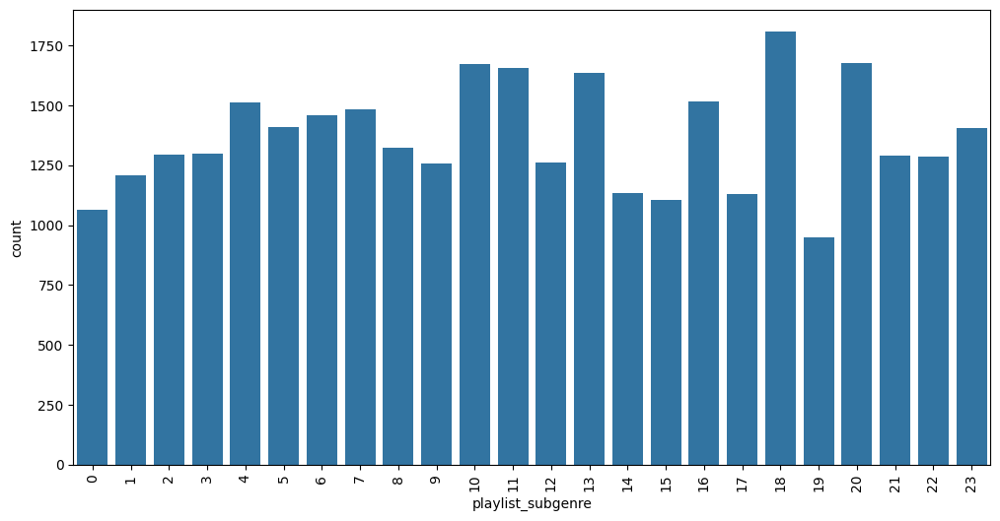

In [ ]:
plt.figure(figsize=(12, 6))
sns.countplot(x='playlist_subgenre', data=df)
plt.xticks(rotation=90)
plt.show()

The graph shows the analysis of Sub-Genre.

## **Popularity Analysis**

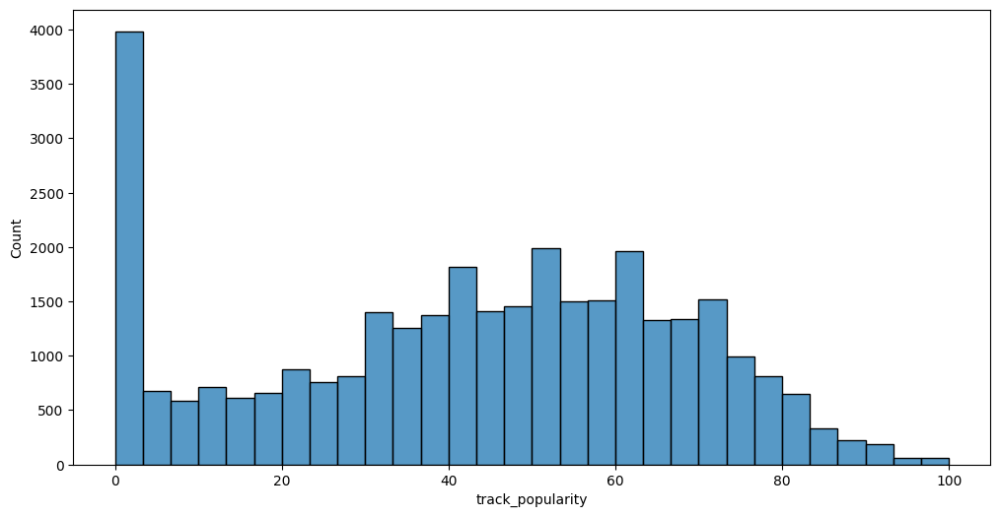

In [ ]:
plt.figure(figsize=(12, 6))
sns.histplot(df['track_popularity'], bins=30)
plt.show()

The graph shows the analysis of Popularity.

# **CORRELATION MATRIX**

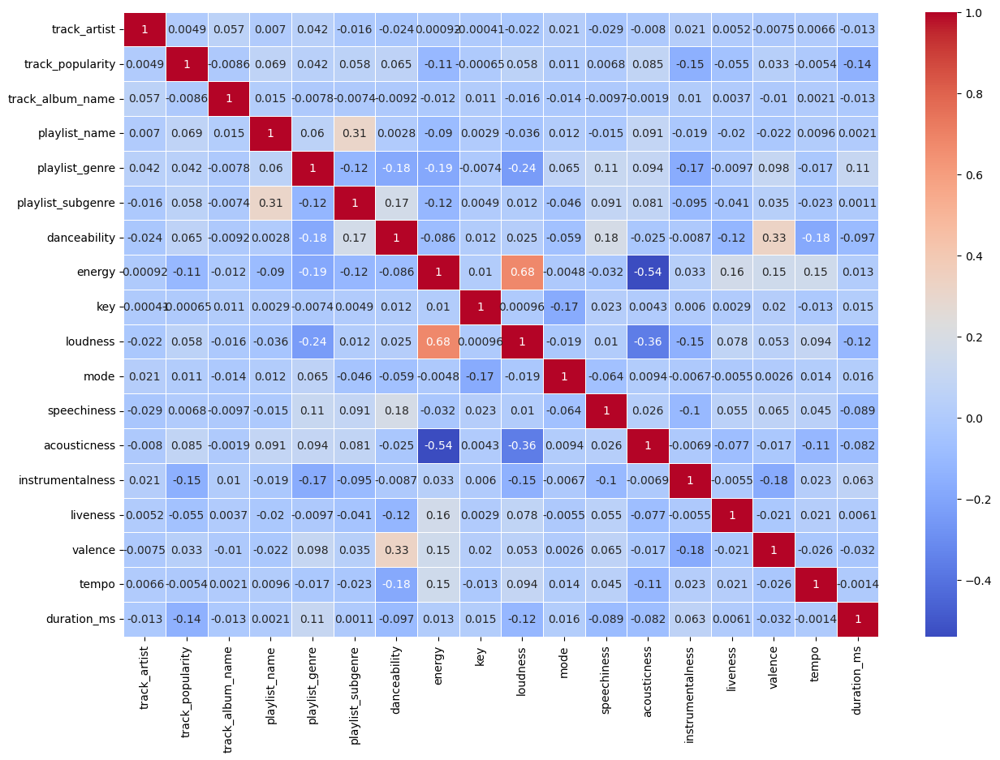

In [ ]:
ndf = df.select_dtypes(include=[np.number])
cormat = ndf.corr()
plt.figure(figsize=(15, 10))
sns.heatmap(cormat, annot=True, cmap='coolwarm', linewidths=0.5)
plt.show()

From the Correlation Matrix we can infer that the data is weakly correlated and can be used without any worry of overfitting.

In [31]:
sample_df=df.sample(int(0.004*len(df)))

In [32]:
print(len(sample_df))

131


[Text(0.5, 1.0, 'Loudness vs Energy Correlation')]

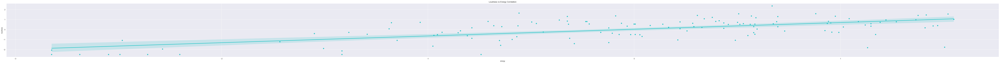

In [33]:
import seaborn as sns
plt.figure(figsize=(110,6))
sns.regplot(data=sample_df,y="loudness",x="energy",color="c").set(title="Loudness vs Energy Correlation")

[Text(0.5, 1.0, 'Track Popularity vs Acousticness Correlation')]

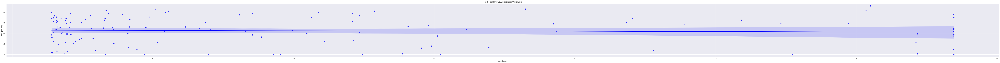

In [34]:
plt.figure(figsize=(110,6))
sns.regplot(data=sample_df,y="track_popularity",x="acousticness",color="b").set(title="Track Popularity vs Acousticness Correlation")

# **CLUSTERING**

## **Feature Selection**

In [ ]:
features = df[['danceability', 'energy', 'valence', 'tempo', 'duration_ms']]
km = KMeans(n_clusters=5, n_init=10, random_state=42)
df['cluster'] = km.fit_predict(features)

## **Visualize Clusters**

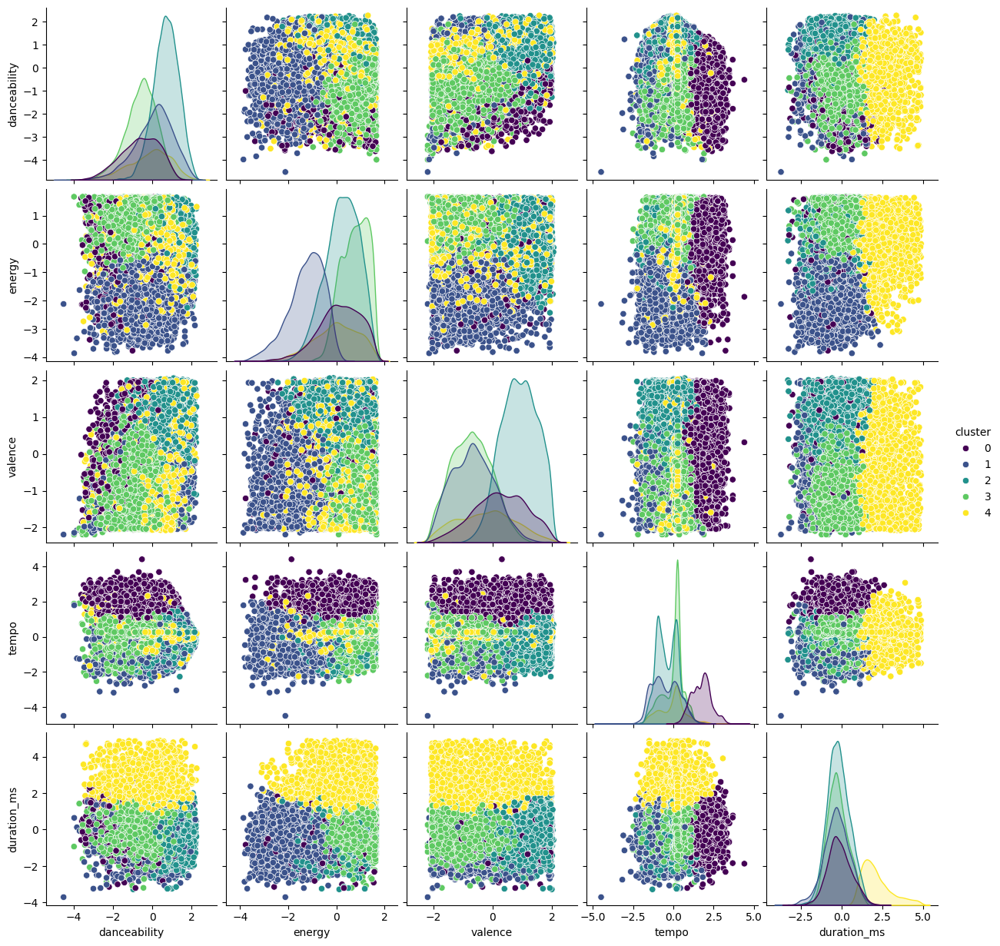

In [ ]:
features = ['danceability', 'energy', 'valence', 'tempo', 'duration_ms']
pairs = df[features + ['cluster']]
sns.pairplot(pairs, hue='cluster', palette='viridis')
plt.show()

Using a Pair-Plot we can see all the different clusters between two features.

# **MODEL BUILDING**

## **Splitting Dataset**

In [ ]:
traindata, testdata = train_test_split(df, test_size=0.2, random_state=42)

## **Using Nearest Neighbours for Recommendation Model**

In [ ]:
modelfeatures = traindata[numfeatures]
nb = NearestNeighbors(n_neighbors=5, algorithm='ball_tree').fit(modelfeatures)

## **EXAMPLE**

In [ ]:
sample = testdata.iloc[0]
samplefeatures = sample[numfeatures].values.reshape(1, -1)
d, i = nb.kneighbors(samplefeatures)
recommendation = traindata.iloc[i[0]]
print("Recommended Tracks:")
print(recommendation[['track_name']])

Recommended Tracks:
                                           track_name
4368                                        I See You
22919                             The Mother We Share
1157                              The Mother We Share
12186  The Dirt (Est. 1981) [feat. Machine Gun Kelly]
14887  The Dirt (Est. 1981) [feat. Machine Gun Kelly]


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(


# **FINAL RESULT VISUALIZATION**

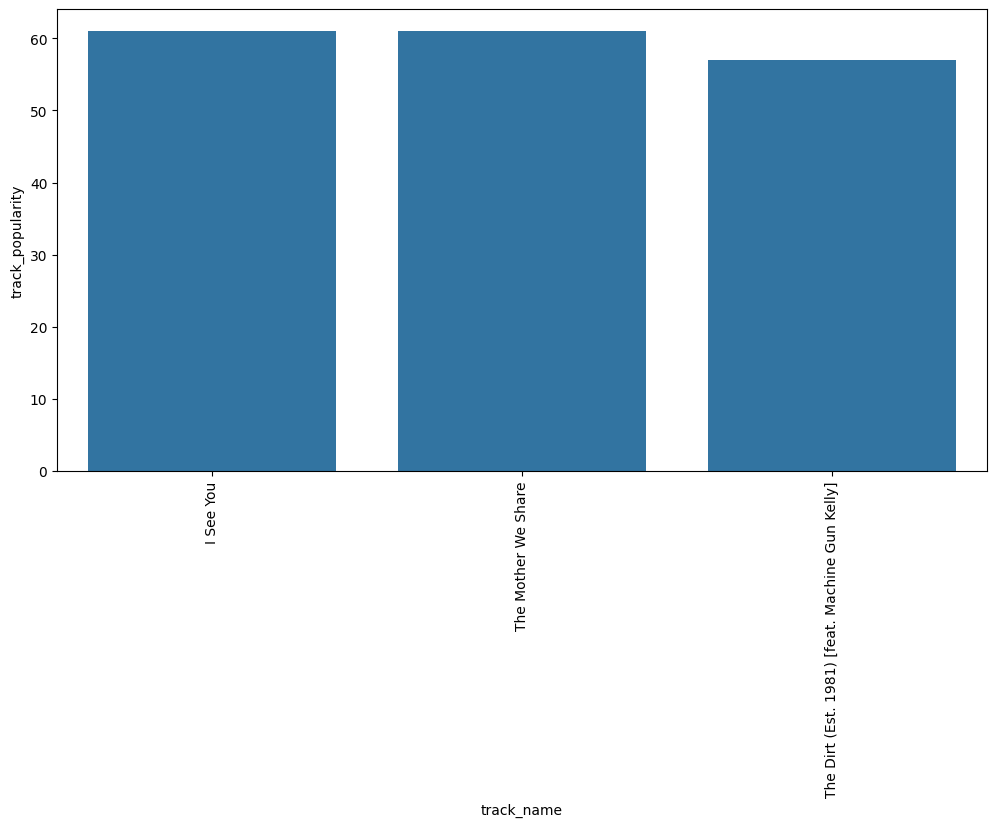

In [ ]:
plt.figure(figsize=(12, 6))
sns.barplot(x=recommendation['track_name'], y=recommendation['track_popularity'])
plt.xticks(rotation=90)
plt.show()

In [ ]:
TRYING OUT WITH DIFFERENT CLASSIFIER

In [38]:
feature_names =['track_name', 'track_artist','track_album_name','track_album_release_date','playlist_genre',
                'playlist_name','playlist_id','playlist_subgenre','danceability','energy','key','loudness','mode','speechiness','acousticness',
                'instrumentalness','liveness','valence', 'tempo','duration_ms']
                
X, y = df[feature_names], df['track_popularity']
X
X = X.select_dtypes(exclude=['object'])
X
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y, test_size=0.2,random_state=42)
X_train
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.cluster import KMeans
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score,confusion_matrix,classification_report

models = {
    'SVM': SVC(),
    'KNN': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Random Forest': RandomForestClassifier(),
    'Naive bayes': GaussianNB(),
    'Neural Networks': MLPClassifier(),
    'K-Means': KMeans(),
    'AdaBoost': AdaBoostClassifier(algorithm='SAMME'),
    'GradientBoosting': GradientBoostingClassifier()
    
}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print(f'{name} Accuracy: {accuracy_score(y_test, y_pred)}')
    print("Precision:",precision_score(y_test, y_pred, average='macro', zero_division=0))
#print("Precision:", precision_score(y_test, y_pred, average='macro', zero_division=1))
    print("Recall:",recall_score(y_test, y_pred,average='macro'))
    print("F1-score:", f1_score(y_test, y_pred,average='macro'))
    print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

SVM Accuracy: 0.0851225826100198
Precision: 0.000851225826100198
Recall: 0.01
F1-score: 0.0015689026101599777
Confusion Matrix:
 [[559   0   0 ...   0   0   0]
 [101   0   0 ...   0   0   0]
 [ 86   0   0 ...   0   0   0]
 ...
 [  3   0   0 ...   0   0   0]
 [  2   0   0 ...   0   0   0]
 [  1   0   0 ...   0   0   0]]
KNN Accuracy: 0.08542713567839195
Precision: 0.11406877698888046
Recall: 0.14048905766764563
F1-score: 0.1146939504319894
Confusion Matrix:
 [[249  39  12 ...   0   1   0]
 [ 32  12   3 ...   1   0   0]
 [ 30   7   9 ...   0   0   0]
 ...
 [  0   0   0 ...   2   0   0]
 [  0   0   0 ...   0   2   0]
 [  0   0   0 ...   0   0   1]]
Decision Tree Accuracy: 0.08222932846048424
Precision: 0.1066201090285923
Recall: 0.13601655481948424
F1-score: 0.1157459402758251
Confusion Matrix:
 [[138  19   8 ...   0   0   0]
 [  9   5   2 ...   0   0   0]
 [ 10   0   6 ...   0   0   0]
 ...
 [  0   0   0 ...   3   0   0]
 [  0   0   0 ...   0   2   0]
 [  0   0   0 ...   0   0   0]]


C:\Users\lenovo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression Accuracy: 0.0851225826100198
Precision: 0.000851225826100198
Recall: 0.01
F1-score: 0.0015689026101599777
Confusion Matrix:
 [[559   0   0 ...   0   0   0]
 [101   0   0 ...   0   0   0]
 [ 86   0   0 ...   0   0   0]
 ...
 [  3   0   0 ...   0   0   0]
 [  2   0   0 ...   0   0   0]
 [  1   0   0 ...   0   0   0]]
Random Forest Accuracy: 0.24562204964215015
Precision: 0.35442282195555613
Recall: 0.30471349263562053
F1-score: 0.3105388770093226
Confusion Matrix:
 [[455   6   0 ...   0   0   0]
 [ 54  10   0 ...   0   0   0]
 [ 35   3  10 ...   0   0   0]
 ...
 [  0   0   0 ...   3   0   0]
 [  0   0   0 ...   0   2   0]
 [  0   0   0 ...   0   0   0]]
Naive bayes Accuracy: 0.07172224760164458
Precision: 0.03132421316247599
Recall: 0.06786475908643276
F1-score: 0.031269936492108956
Confusion Matrix:
 [[423   0   0 ...   5   0   0]
 [ 68   0   0 ...   1   0   0]
 [ 53   0   0 ...   2   0   0]
 ...
 [  0   0   0 ...   1   0   0]
 [  0   0   0 ...   0   1   0]
 [  0   0

C:\Users\lenovo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Neural Networks Accuracy: 0.08481802954164763
Precision: 0.01085152167230249
Recall: 0.010304894184358863
F1-score: 0.0023050019361062564
Confusion Matrix:
 [[554   0   0 ...   0   0   0]
 [ 99   0   0 ...   0   0   0]
 [ 84   0   0 ...   0   0   0]
 ...
 [  3   0   0 ...   0   0   0]
 [  2   0   0 ...   0   0   0]
 [  1   0   0 ...   0   0   0]]
K-Means Accuracy: 0.015989036089538604
Precision: 0.0013447680392694697
Recall: 0.008788446365854657
F1-score: 0.001935519228571259
Confusion Matrix:
 [[57 48 70 ...  0  0  0]
 [11  8 10 ...  0  0  0]
 [ 8 13 13 ...  0  0  0]
 ...
 [ 0  0  0 ...  0  0  0]
 [ 0  1  1 ...  0  0  0]
 [ 1  0  0 ...  0  0  0]]


C:\Users\lenovo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


AdaBoost Accuracy: 0.0851225826100198
Precision: 0.000851225826100198
Recall: 0.01
F1-score: 0.0015689026101599777
Confusion Matrix:
 [[559   0   0 ...   0   0   0]
 [101   0   0 ...   0   0   0]
 [ 86   0   0 ...   0   0   0]
 ...
 [  3   0   0 ...   0   0   0]
 [  2   0   0 ...   0   0   0]
 [  1   0   0 ...   0   0   0]]
GradientBoosting Accuracy: 0.15775848941678086
Precision: 0.21036402421229308
Recall: 0.2321031769709192
F1-score: 0.2064627923158329
Confusion Matrix:
 [[364   4   5 ...   0   0   0]
 [ 52   2   0 ...   0   0   0]
 [ 46   2   6 ...   0   0   0]
 ...
 [  0   0   0 ...   2   0   0]
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]]


C:\Users\lenovo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


CONCLUSION:

In [ ]:
models = [SVC(), KNeighborsClassifier(), LogisticRegression(max_iter=1000), AdaBoostClassifier(algorithm='SAMME')]

for model in models:
    model.fit(X_train, y_train)
    # Evaluate the model
    print(f"{model.__class__.__name__}: {model.score(X_test, y_test)}")

SVC: 0.0851225826100198
KNeighborsClassifier: 0.08542713567839195
